In [ ]:
%matplotlib inline

# Assignment 1 - Image Classification

This notebook contains the required task for the first assignment of the Software for Advanced Machine Learning course. Read the task description and implement the empty code cells. Each section represents a stage along implementing an image classifier, from loading and inspecting the dataset to training a **pre-trained** Convolutional Neural Network architecture. The sections are to guide you but you do not have to follow that specific order. 

Copy this notebook to your drive (File -> Save a copy in Drive), edit it and upload the final ipynb file to [Canvas](https://canvas.elte.hu) or upload the link to the Colab notebook itself. If you have your own machine with Jupyter installed, you can work there as well.

**Note** Make sure the notebook is using GPU accelerataion in Edit -> Notebook settings, otherwise training and evaluation can be very slow.

## Rules and Comments
- From the list of datasets and architectures listed in canvas, each student was atributed **1 dataset and 1 architecture** to use within this assignment. Please confirm yours in the Canvas assignment's description. 
- This is an DL class so to pass the homework you do have to implement a working classifier, just loading the data or having a "random-guess" performance is not enough.
- As always, copying others' code will make you fail the homework automatically (and thus the course). Remember that you will have to defend the assignment at the end of the semester.
- **Deadline is October 21**
- Make sure your code can be run from an empty state (use Runtime -> Run all in the menu after restarting the notebook)
- Feel free to add more code cells as needed. But don't put code into external Python files to ease the reviewing.
- Please add your name and Neptun ID below for easier identification.

**Name:**  Mohamad Nashouqu
**Neptun ID:** fj64me

## Task description
Your task is to train an already pretrained Convolutional Neural Network architecture on a dataset, both given in canvas. The datasets contain images as input and class labels as target, thus you have to solve a Supervised Machine Learning Classification problem. 

The dataset shoud be divided into train, validation and test set, for which results should be presented for all.

You can either train the architecture you were given without changing its layers, or you can add more layers, if you believe it increases the accuracy. There is no expected percentage of accuracy, but **your accuracy should be better than random guessing and your loss has to decrease throughout the epochs**. We expect you to use Tensorboard for visualizing the accuracy, loss and details about the model and use Early stopping while training your network.



In [ ]:
# pytorch imports
import torch
import torchvision
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
from torch import nn
from torch import optim
from torch.autograd import Variable

import os
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import random
from tqdm import tqdm_notebook as tqdm
import math
import time
from IPython.core.debugger import set_trace
from torch.optim import lr_scheduler
import copy
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device
%load_ext tensorboard

# Import SummaryWriter
from torch.utils.tensorboard import SummaryWriter

# Create a SummaryWriter instance
# SummaryWriter writes event files to log_dir
log_dir = "runs/cifa_lienear"
writer = SummaryWriter(log_dir)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Load Data
---------

We will use torchvision and torch.utils.data packages for loading the
data.

The problem we're going to solve today is to train a model to classify
**ants** and **bees**. We have about 120 training images each for ants and bees.
There are 75 validation images for each class. Usually, this is a very
small dataset to generalize upon, if trained from scratch. Since we
are using transfer learning, we should be able to generalize reasonably
well.

This dataset is a very small subset of imagenet.

.. Note ::
   Download the data from
   `here <https://download.pytorch.org/tutorial/hymenoptera_data.zip>`_
   and extract it to the current directory.



In [ ]:
import glob
        
class FOOD101():
    def __init__(self):
        self.train_ds, self.valid_ds, self.train_cls, self.valid_cls = [None]*4
        imagenet_stats = [(0.485, 0.456, 0.406), (0.229, 0.224, 0.225)]
        self.imgenet_mean = imagenet_stats[0]
        self.imgenet_std = imagenet_stats[1]
   
    def get_data_extract(self):
        if "food-101" in os.listdir():
            print("Dataset already exists")
        else:
            print("Downloading the data...")
            !wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
            print("Dataset downloaded!")
            print("Extracting data..")
            !tar xzvf food-101.tar.gz
            print("Extraction done!")
    
        
    def _get_tfms(self):
        train_tfms = transforms.Compose([
            transforms.Resize(224),    
            transforms.RandomResizedCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(self.imgenet_mean, self.imgenet_std)])
        
        valid_tfms = transforms.Compose([
            transforms.Resize(224),    
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(self.imgenet_mean, self.imgenet_std)])        
        return train_tfms, valid_tfms            
            
    def get_dataset(self,root_dir='.'):
        print("--------------- get_dataset ----------------")
        train_tfms, valid_tfms = self._get_tfms() # transformations
        print("--------------- self._get_tfms() ----------------")
        
        self.train_ds = datasets.ImageFolder(root=TRAIN_PATH, transform=train_tfms)
        print("Done TRAIN_PATH")
        self.valid_ds = datasets.ImageFolder(root=VALID_PATH, transform=valid_tfms)        
        print("Done VALID_PATH")
        
        self.train_classes = self.train_ds.classes
        print("self.train_classes")
        self.valid_classes = self.valid_ds.classes
        print("self.valid_classes")
        
        assert self.train_classes==self.valid_classes
        return self.train_ds, self.valid_ds, self.train_classes

    
    def get_dls(self, train_ds, valid_ds, bs, **kwargs):
        return (DataLoader(train_ds, batch_size=bs, shuffle=True, **kwargs),
               DataLoader(valid_ds, batch_size=bs//2, shuffle=False, **kwargs))
    
food = FOOD101()    
food.get_data_extract()


Dataset already exists


Streaming output truncated to the last 5000 lines.
res food-101/testing/french_fries/2941321.jpg
res food-101/testing/french_fries/925636.jpg
res food-101/testing/french_fries/2212633.jpg
res food-101/testing/french_fries/2878424.jpg
res food-101/testing/french_fries/2106366.jpg
res food-101/testing/french_fries/2335210.jpg
res food-101/testing/french_fries/1875986.jpg
res food-101/testing/french_fries/2586818.jpg
res food-101/testing/french_fries/1647142.jpg
res food-101/testing/french_fries/2213664.jpg
res food-101/testing/french_fries/3598151.jpg
res food-101/testing/french_fries/1238390.jpg
res food-101/testing/french_fries/2828656.jpg
res food-101/testing/french_fries/1987068.jpg
res food-101/testing/french_fries/911982.jpg
res food-101/testing/french_fries/605616.jpg
res food-101/testing/french_fries/2479034.jpg
res food-101/testing/french_fries/3159377.jpg
res food-101/testing/french_fries/557390.jpg
res food-101/testing/french_fries/3842428.jpg
res food-101/testing/french_fries

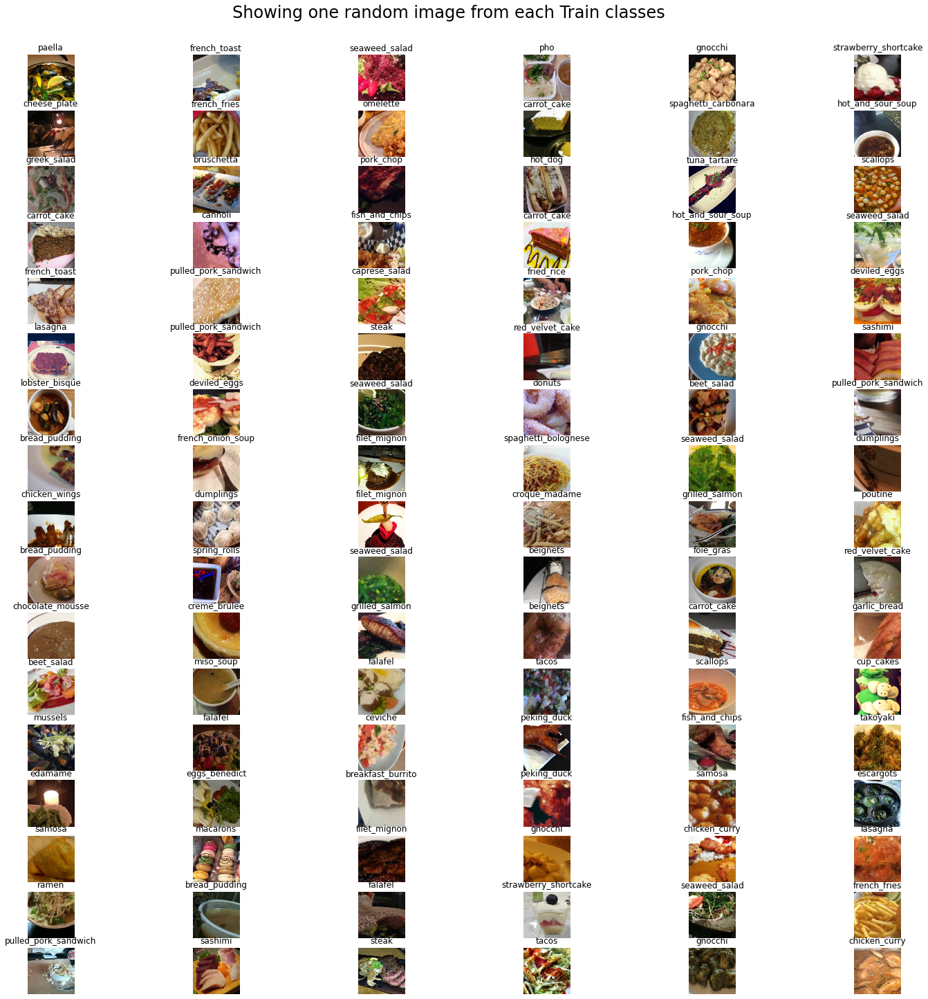

In [ ]:
# This can be used to print predictions too
class DataBunch():
    def __init__(self, train_dl, valid_dl, c=None):
        self.train_dl, self.valid_dl, self.c = train_dl, valid_dl, c
    
    @property
    def train_ds(self): return self.train_dl.dataset
    
    @property
    def valid_ds(self): return self.valid_dl.dataset
    
    def __repr__(self):
        return str(self.__class__.__name__)+" obj (train & valid DataLoaders)"
    
    
def show_ds(trainset, classes, validset=None, cols=6, rows=17, preds=None, is_pred=False, is_valid=False):        
    fig = plt.figure(figsize=(25,25))
    fig.suptitle(f"Showing one random image from each {'Validation' if is_valid else 'Train'} classes", y=0.92, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue
    columns = cols
    rows = rows
    imgenet_mean = imagenet_stats[0]
    imgenet_std = imagenet_stats[1]  

    for i in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, i)
        
        if is_pred and testset:
            img_xy = np.random.randint(len(testset));
            np_img = testset[img_xy][0].numpy()
            img = np.transpose(np_img, (1,2,0))            
            img = img * imgenet_std + imgenet_mean
        else:
            img_xy = np.random.randint(len(trainset));
            np_img = trainset[img_xy][0].numpy()
            img = np.transpose(np_img, (1,2,0))
            img = img * imgenet_std + imgenet_mean
        
        if is_pred:
            plt.title(classes[int(preds[img_xy])] + "/" + classes[testset[img_xy][1]])
        else:
            plt.title(classes[trainset[img_xy][1]])
        plt.axis('off')
        img = np.clip(img, 0, 1)
        plt.imshow(img, interpolation='nearest')
    plt.show()
def pp_(*args, n_dash=120):
    for arg in args:
        print(arg)
        print("-"*n_dash)
bs = 128
epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# ADD YOUR CODE HERE
imagenet_stats = [(0.485, 0.456, 0.406), (0.229, 0.224, 0.225)]
import shutil
def generate_train_test_images(food_path):
      
      path = food_path + "/testing"
      original_images = food_path + "/images"
      if not (os.path.isdir(path)):
        os.mkdir(path)
      list_subfolders_with_paths = [f for f in os.scandir(original_images) if f.is_dir()]
      
      for folder in list_subfolders_with_paths:
        folder = folder.name
        
        #print("folder",str(folder))
        testing_folder = str(path) + "/" + str(folder)
        print("testing_folder",testing_folder)
        if not (os.path.isdir(testing_folder)):
      
          os.mkdir(testing_folder)
          print("Done")
        # All files ending with .txt
        folder_training_data = original_images + "/" + folder
        #print("folder_training_data",folder_training_data)
        
        files = glob.glob((folder_training_data + "/*"))
        length_files = len(files)
        #print(files)
        #print("length_files",length_files)
        number_of_testing_images_for_one_class = int(length_files * 20 / 100)
        #print("number_of_testing_images_for_one_class", number_of_testing_images_for_one_class)
        for i in range(number_of_testing_images_for_one_class): 
          original_file_path = files[i]
          name_without_path = original_file_path.split('/')[-1]
          #print("name_without_path",name_without_path)
          #print(original_file_path,"-------------",testing_folder +"/" + name_without_path)
          res = shutil.move(original_file_path,testing_folder +"/" + name_without_path)
          print("res",res)
FOOD_PATH = "food-101"
IMG_PATH = FOOD_PATH+"/images"
META_PATH = FOOD_PATH+"/meta"
TRAIN_PATH = FOOD_PATH+"/images"
VALID_PATH = FOOD_PATH+"/testing"
MODEL_PATH = 'model_data/'
generate_train_test_images(FOOD_PATH)
train_ds, valid_ds, classes =  food.get_dataset()
num_classes = len(classes)
pp_(classes,num_classes)
train_dl, valid_dl = food.get_dls(train_ds, valid_ds, bs=bs, num_workers=2)
data = DataBunch(train_dl, valid_dl, c=num_classes)
show_ds(data.train_ds, classes)

In [ ]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.RandomHorizontalFlip(),
        #transforms.RandomVerticalFlip(),
        #transforms.RandomAffine(degrees=40, scale=(.9, 1.1), shear=0),
        #transforms.RandomPerspective(distortion_scale=0.2),
        #transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = 'food-101'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
batch_size = 4
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
len(class_names)

101

Visualize a few images
^^^^^^^^^^^^^^^^^^^^^^
Let's visualize a few training images so as to understand the data
augmentations.



In [ ]:
import warnings
warnings.filterwarnings("ignore") 

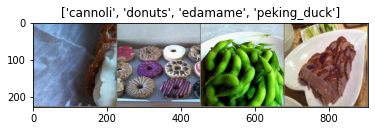

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
      
            
        print('Epoch {}/{} LR {:.6f}'.format(epoch, num_epochs - 1, scheduler.get_last_lr()[0]))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for i,ob in enumerate(dataloaders[phase]):
                inputs = ob[0]
                labels = ob[1] 
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()
                
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            writer.add_scalar(str(phase) + ' loss',
                          epoch_loss,
                          epoch * len(dataloaders[phase]) + i)
            writer.add_scalar(str(phase) + ' accuracy',
                          epoch_acc,
                          epoch * len(dataloaders[phase]) + i)
            
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
            

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
              early_stopping(epoch_loss)
            if early_stopping.early_stop:
              break
        if early_stopping.early_stop:
          break
      
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [ ]:
def evaluate_model(model, criterion, optimizer, scheduler, num_epochs=25):
            
    
            model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for i,ob in enumerate(dataloaders['val']):
                inputs = ob[0]
                labels = ob[1] 
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                
                    # backward + optimize only if in training phase

                # statistics
                running_corrects += torch.sum(preds == labels.data)
                
            epoch_acc = running_corrects.double() / dataset_sizes['val']
            
            print("Evaluation accuracy on test set",epoch_acc)
            

            
      
    

In [ ]:
class EarlyStopping():
    """
    Early stopping to stop the training when the loss does not improve after
    certain epochs.
    """
    def __init__(self, patience=5, min_delta=0):
        """
        :param patience: how many epochs to wait before stopping when loss is
               not improving
        :param min_delta: minimum difference between new loss and old loss for
               new loss to be considered as an improvement
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False
        self.best_model = './cifar_best_net.pth'

    def __call__(self, val_loss):
        if self.best_loss == None:
            self.best_loss = val_loss
        elif self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            torch.save(model_ft.state_dict(), self.best_model)
        elif self.best_loss - val_loss < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

Visualizing the model predictions
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

Generic function to display predictions for a few images




In [ ]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            
            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                print("labels",labels)
                print('ground_trouth: {}'.format(class_names[labels.data[j]]))
                
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

# Train the convnet from scratch

In [ ]:
device

device(type='cuda', index=0)

Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




In [ ]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, len(class_names))
early_stopping = EarlyStopping()

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=15, gamma=0.1)

Train and evaluate
^^^^^^^^^^^^^^^^^^

It should take around 15-25 min on CPU. On GPU though, it takes less than a
minute.




In [ ]:

%tensorboard --logdir=runs


Reusing TensorBoard on port 6006 (pid 337), started 9:59:50 ago. (Use '!kill 337' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=50)

Epoch 0/49 LR 0.001000
----------
train Loss: 3.1235 Acc: 0.2746
val Loss: 2.2846 Acc: 0.4985

Epoch 1/49 LR 0.001000
----------
train Loss: 2.5855 Acc: 0.3867
val Loss: 1.9972 Acc: 0.5715

Epoch 2/49 LR 0.001000
----------
train Loss: 2.3531 Acc: 0.4371
val Loss: 1.8333 Acc: 0.6012

Epoch 3/49 LR 0.001000
----------
train Loss: 2.1829 Acc: 0.4724
val Loss: 1.7513 Acc: 0.6217

Epoch 4/49 LR 0.001000
----------
train Loss: 2.0579 Acc: 0.5001
val Loss: 1.5786 Acc: 0.6546

Epoch 5/49 LR 0.001000
----------
train Loss: 1.9691 Acc: 0.5194
val Loss: 1.5520 Acc: 0.6624

Epoch 6/49 LR 0.001000
----------
train Loss: 1.8928 Acc: 0.5374
val Loss: 1.5016 Acc: 0.6771

Epoch 7/49 LR 0.001000
----------
train Loss: 1.8083 Acc: 0.5555
val Loss: 1.4722 Acc: 0.6836

Epoch 8/49 LR 0.001000
----------
train Loss: 1.7489 Acc: 0.5696
val Loss: 1.4750 Acc: 0.6796
INFO: Early stopping counter 1 of 5

Epoch 9/49 LR 0.001000
----------
train Loss: 1.6950 Acc: 0.5831
val Loss: 1.4973 Acc: 0.6942
INFO: Early sto

In [ ]:
evaluate_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=50)

Evaluation accuracy on test set tensor(0.7670, device='cuda:0', dtype=torch.float64)


labels tensor([28, 92, 52, 97], device='cuda:0')
ground_trouth: croque_madame


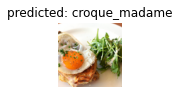

labels tensor([28, 92, 52, 97], device='cuda:0')
ground_trouth: spring_rolls


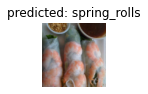

labels tensor([28, 92, 52, 97], device='cuda:0')
ground_trouth: gyoza


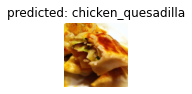

labels tensor([28, 92, 52, 97], device='cuda:0')
ground_trouth: takoyaki


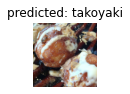

labels tensor([90, 53, 69, 97], device='cuda:0')
ground_trouth: spaghetti_bolognese


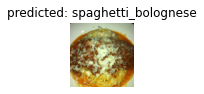

labels tensor([90, 53, 69, 97], device='cuda:0')
ground_trouth: hamburger


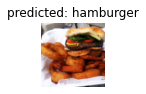

In [ ]:
visualize_model(model_ft)

In [ ]:
How good are your results? Do you think the network is overfitted or underfitted? If yes, what do you think lead to that? If not, justify.
The results is very good, and the model is balanced, according to the accuracy figure the training and validation figures are so close to earch other
and they still increased togother until they reached the early stop that means the network stopped learning 